# 1- Import libraries

In [ ]:
!pip install catboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.6/98.6 MB 9.3 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

from sklearn.model_selection import train_test_split

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import VotingRegressor

import xgboost 
import lightgbm
import catboost

from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

# 2- Load data

In [ ]:
df = pd.read_csv("Diamond-train.csv", index_col="Id")

# 3- Data read

In [ ]:
# Let's explore a random sample of data 

df.sample(10)

,carat,cut,color,clarity,depth,table,price,x,y,z
Id,,,,,,,,,,
8479,0.55,Premium,D,SI1,61.9,60.0,1815,5.23,5.14,3.21
9733,1.52,Fair,I,SI2,64.7,58.0,6905,7.19,7.22,4.66
8871,0.91,Good,G,SI2,62.5,60.0,3149,6.05,6.08,3.79
29901,0.23,Very Good,E,VVS2,63.3,56.0,680,3.92,3.88,2.47
41994,1.23,Very Good,F,SI2,61.9,58.0,6233,6.77,6.79,4.20
17464,0.90,Good,D,SI2,64.0,59.0,4078,6.04,6.09,3.88
18300,0.51,Ideal,D,VS2,62.3,57.0,1882,5.12,5.09,3.18
5876,0.74,Ideal,F,VS1,61.7,56.0,3170,5.83,5.78,3.58
34397,1.33,Premium,H,VS2,62.6,58.0,7943,7.07,7.01,4.41


In [ ]:
df.shape

(43152, 10)

In [ ]:
df.columns.value_counts()

carat      1
cut        1
color      1
clarity    1
depth      1
table      1
price      1
x          1
y          1
z          1
dtype: int64

In [ ]:
df.dtypes.value_counts()

float64    6
object     3
int64      1
dtype: int64

In [ ]:
# Check the messing values
df.isnull().sum()

# Check the missing values by more professional way --> if no output means no missing values
assert df.isnull().sum().sum() == 0

In [ ]:
# Let's check a duplicated data
print("Duplicated number is: ", df.duplicated().value_counts()[1])

# Check in another format, if True --> No duplicated values, if False --> there're a duplicated values
(df.duplicated().sum() == 0)

Duplicated number is:  97


False

In [ ]:
# Let's check the columns that have duplicated values
dup_filter = np.where(df.duplicated() == 1)

#len(df.iloc[dup_filter][df.columns])
df.iloc[dup_filter][df.columns]

,carat,cut,color,clarity,depth,table,price,x,y,z
Id,,,,,,,,,,
5429,0.57,Premium,E,SI2,62.5,54.0,1058,5.35,5.30,3.33
6705,2.01,Fair,H,SI2,64.9,56.0,10184,7.88,7.81,5.09
7724,0.32,Ideal,H,VVS2,61.8,55.0,828,4.42,4.38,2.72
11090,1.55,Very Good,H,SI1,63.2,57.0,7066,7.35,7.31,4.64
11335,0.60,Very Good,E,SI2,63.2,60.0,1250,5.32,5.28,3.35
...,...,...,...,...,...,...,...,...,...,...
41649,0.52,Ideal,D,VS2,61.8,55.0,1822,5.16,5.19,3.20
41776,0.71,Good,E,SI2,57.5,58.0,1783,5.91,5.89,3.39
42166,0.52,Premium,F,SI2,62.7,57.0,1073,5.11,5.07,3.19


look!! all columns are appered after doing a filter! that's mean all attributes have duplicated values

In [ ]:
# let's check the number of non duplicated values
Non_duplicated = len(df.iloc[np.where(df.duplicated() == 0)][df.columns])

print("Non duplicated values are:", Non_duplicated )

Non duplicated values are: 43055


In [ ]:
# The duplicated values are just in 97 rows, so let's drop it
df.drop_duplicates(inplace = True)

assert df.duplicated().sum() == 0

No output!! this means we have successfully dropped duplicates.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43055 entries, 1 to 43152
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    43055 non-null  float64
 1   cut      43055 non-null  object 
 2   color    43055 non-null  object 
 3   clarity  43055 non-null  object 
 4   depth    43055 non-null  float64
 5   table    43055 non-null  float64
 6   price    43055 non-null  int64  
 7   x        43055 non-null  float64
 8   y        43055 non-null  float64
 9   z        43055 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 3.6+ MB


In [ ]:
df.describe()

,carat,depth,table,price,x,y,z
count,43055.000000,43055.000000,43055.000000,43055.000000,43055.000000,43055.000000,43055.000000
mean,0.797752,61.746373,57.459798,3930.016235,5.731555,5.735063,3.538528
std,0.473198,1.435066,2.234325,3984.939986,1.120732,1.148389,0.707922
min,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,0.400000,61.000000,56.000000,948.000000,4.710000,4.720000,2.910000
50%,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.040000,62.500000,59.000000,5312.500000,6.540000,6.540000,4.040000
max,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


1- I see that there're an outliers in carat, price, y, & z, becuse there's a high gap in min & max by comparing e' mean

2- Also there're Zeros in x, y, z!!!!
- x, y & z all are describes the dimentions of diamonds
- Is this means that there diamonds have dimentionless?? I don't think
- So, let's do a try to descover...👇👇

In [ ]:
# Here i want to descover the number of zeros that the attributes have

zero_attrib = df.x, df.y, df.z

for zero in zero_attrib:
    
    print("Number of zeros in ", zero.name)
    print((zero == 0).value_counts()[True])
    print()
    

Number of zeros in  x
5

Number of zeros in  y
4

Number of zeros in  z
17



Very little
- So let's drop them.. 👇👇

In [ ]:
# Let's drop the zero values

df = df.drop(df[df.x==0].index)
df = df.drop(df[df.y ==0].index)
df = df.drop(df[df.z== 0].index)


In [ ]:
# Let's take a look by describe() again

df.describe()

,carat,depth,table,price,x,y,z
count,43038.000000,43038.000000,43038.000000,43038.000000,43038.000000,43038.000000,43038.000000
mean,0.797475,61.746582,57.459375,3928.189112,5.731744,5.735116,3.539926
std,0.472928,1.434702,2.233822,3982.731057,1.118784,1.146848,0.704559
min,0.200000,43.000000,43.000000,326.000000,3.730000,3.680000,1.070000
25%,0.400000,61.000000,56.000000,948.000000,4.710000,4.720000,2.910000
50%,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.040000,62.500000,59.000000,5311.750000,6.540000,6.540000,4.040000
max,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


Look!! No zeros
- The drop is Done 🎉🎉

In [ ]:
# let's see the corelation of price with other attributes

(df.corr()['price'].sort_values(ascending=False)).to_frame()

,price
price,1.000000
carat,0.921864
x,0.887122
z,0.864745
y,0.862800
table,0.128029
depth,-0.013395


- Most numerical attributes have a significant correleation e` price

In [ ]:
# Here i explore sample of object attribute

df.select_dtypes('object').sample(5)

,cut,color,clarity
Id,,,
3236,Premium,H,SI1
17852,Ideal,G,SI2
29958,Ideal,G,VS2
2040,Premium,F,VS2
39475,Ideal,E,VS1


In [ ]:
# let me explore unique object values

for unique_col in df.select_dtypes('object'):
    
    print("- Unique values for", unique_col, "are\n", df[unique_col].unique())
    print(" Number of unique is:", df[unique_col].nunique())
    print("") 

- Unique values for cut are
 ['Ideal' 'Premium' 'Very Good' 'Fair' 'Good']
 Number of unique is: 5

- Unique values for color are
 ['I' 'G' 'F' 'H' 'D' 'E' 'J']
 Number of unique is: 7

- Unique values for clarity are
 ['SI2' 'VVS2' 'VS2' 'IF' 'VS1' 'SI1' 'VVS1' 'I1']
 Number of unique is: 8



# 4- EDA

-
# A- EDA on numerical attributes 🧠👓

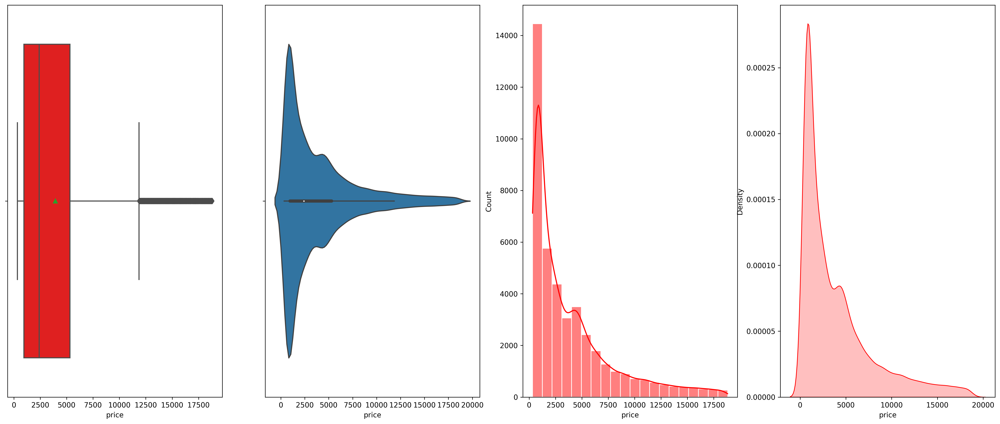

In [ ]:
# Price

fig, axes = plt.subplots(1, 4, figsize=(25, 10), dpi = 290)

fig = px.box(df.price, orientation="h", template="plotly_dark", width=1240, height= 400)
fig.show()

sns.boxplot(x= df.price, showmeans=True, color='red', ax=axes[0])

sns.set_style('dark')

sns.violinplot(x= df.price, ax=axes[1])

sns.histplot(x= df.price, bins=20, color="red", kde=True, ax=axes[2])

sns.kdeplot(x= df.price, shade=True, color='red', ax=axes[3]);


1- Look! i see most diamond prices between 100 & 5k
- you can see this by looking to violen plot, kde...

2- Also there's Right skewed by looking to histplot
- this beacuse large prices as 18k.

In [ ]:
# 90% of prices are at 9k or below

df.price.quantile(0.9)

9820.0

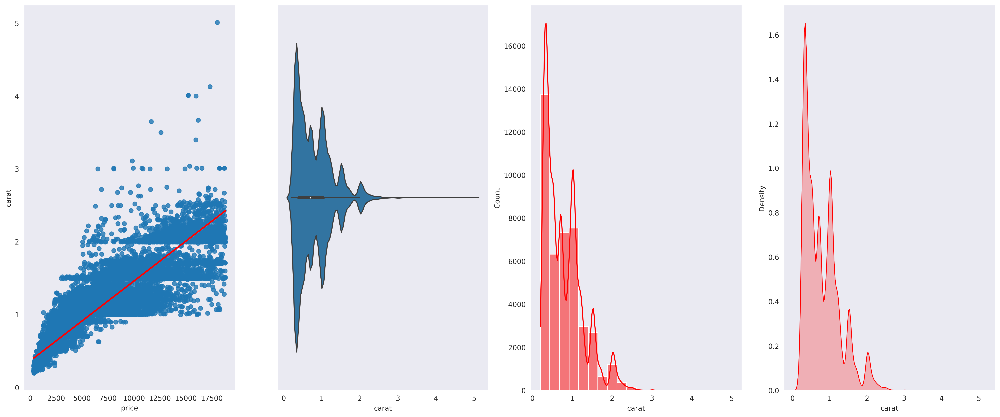

In [ ]:
# Carat --> weight of diamonds, each 1 carat = 0.20 gram

fig, axes = plt.subplots(1, 4, figsize=(25, 10), dpi = 290)

fig = px.box(df.carat, orientation="h", template="plotly_dark", width=1240, height= 400)
fig.show()

# Carat vs price
sns.regplot(x= df.price, y= df.carat, line_kws={"color": "red"}, ax=axes[0])

sns.set_style('dark')

sns.violinplot(x= df.carat, ax=axes[1])

sns.histplot(x= df.carat, bins=20, color="red", kde=True, ax=axes[2])

sns.kdeplot(x= df.carat, shade=True, color='red', ax=axes[3]);


1- Note that the majority of diamond weights range from 0.2 to approximately 1.4 carats

- "ct" stands for carat, which is a unit of weight for diamonds.
- This is logical because the ideal average diamond weight is considered to be 0.75 carats.

2- There are rare diamond weights at 3, 4, and 5 carats

- They are far from the most common diamond weights (deviating from the average), making them outliers.
- The concept behind these rare weights is that people prefer to purchase diamonds with lighter weights, rather than heavier ones.

3- By observing the regplot, we can observe an upward trend 🚀💹

- between the price and carat (weight) of diamonds.
- This indicates that as the carat increases, the price also increases.

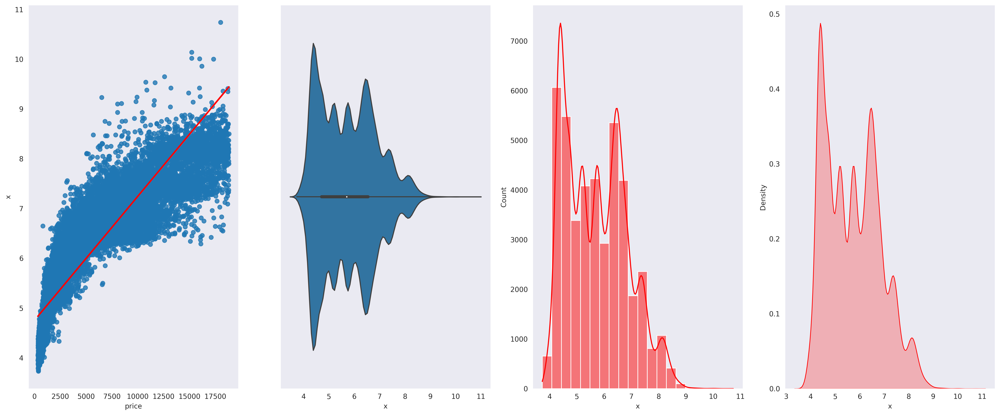

In [ ]:
# x --> lenght of diamonds (A mesurement)

fig, axes = plt.subplots(1, 4, figsize=(25, 10), dpi = 290)

fig = px.box(df.x, orientation="h", template="plotly_dark",  width=1240, height= 400)
fig.show()

#x vs price
sns.regplot(x= df.price, y= df.x, line_kws={"color": "red"}, ax=axes[0])

sns.set_style('dark')

sns.violinplot(x= df.x, ax=axes[1])

sns.histplot(x= df.x, bins=20, color="red", kde=True, ax=axes[2])

sns.kdeplot(x= df.x, shade=True, color='red', ax=axes[3]);


1- I can see that the majority of diamonds have lengths around 4.5, 5, 6, and 7 mm
- Look to hist, KDE.

2- Also the trend line between diamond length & diamond price
- it start from ~4.8 until ~8
- this good point to put in our consider 
- if we want to make diamonds, we should make the length between 4 & 8 mm
- because less than 4mm or > 8mm, does'nt add more to price


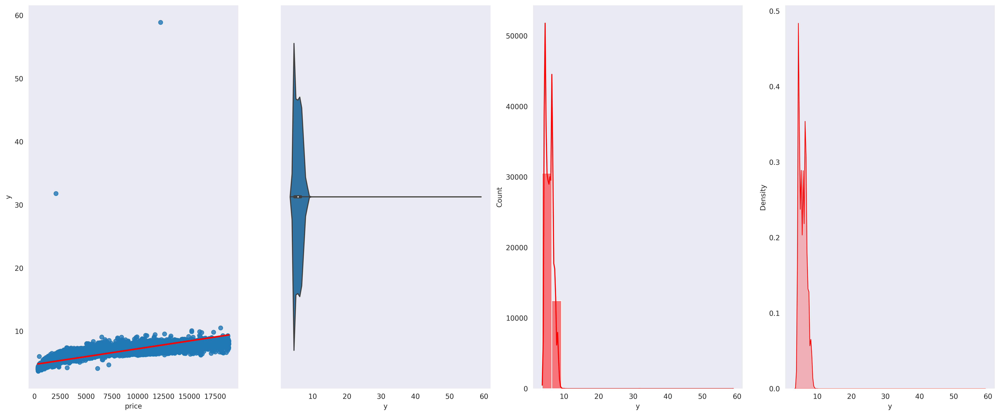

In [ ]:
# y --> width of diamonds (A measurement)

fig, axes = plt.subplots(1, 4, figsize=(25, 10), dpi = 290)

fig = px.box(df.y, orientation="h", template="plotly_dark",  width=1240, height= 400)
fig.show()

# y vs price
sns.regplot(x= df.price, y= df.y, line_kws={"color": "red"}, ax=axes[0])

sns.set_style('dark')

sns.violinplot(x= df.y, ax=axes[1])

sns.histplot(x= df.y, bins=20, color="red", kde=True, ax=axes[2])

sns.kdeplot(x= df.y, shade=True, color='red', ax=axes[3]);


1- I see the most diamond width is  between 4 & 9
- and i see it the optimum

2- look to regplot!!! the width at 30mm or 60mm, does'nt add any thing to price
- because the more width, the more affect on the shape of diamond

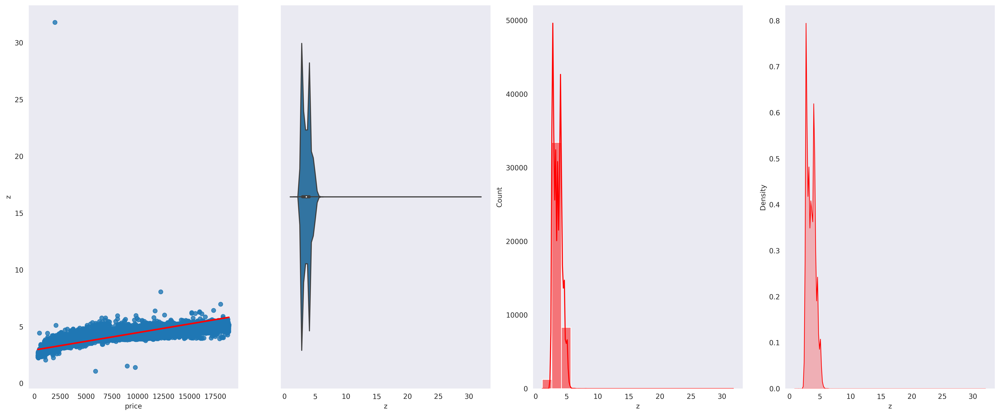

In [ ]:
# z --> depth of diamonds (A measurement)
# The depth of a diamond refers to its measurement from top to bottom

fig, axes = plt.subplots(1, 4, figsize=(25, 10), dpi = 290)

fig = px.box(df.z, orientation="h", template="plotly_dark", width=1240, height= 400)
fig.show()

# z vs price
sns.regplot(x= df.price, y= df.z, line_kws={"color": "red"}, ax=axes[0])

sns.set_style('dark')

sns.violinplot(x= df.z, ax=axes[1])

sns.histplot(x= df.z, bins=20, color="red", kde=True, ax=axes[2])

sns.kdeplot(x= df.z, shade=True, color='red', ax=axes[3]);


- As the width...

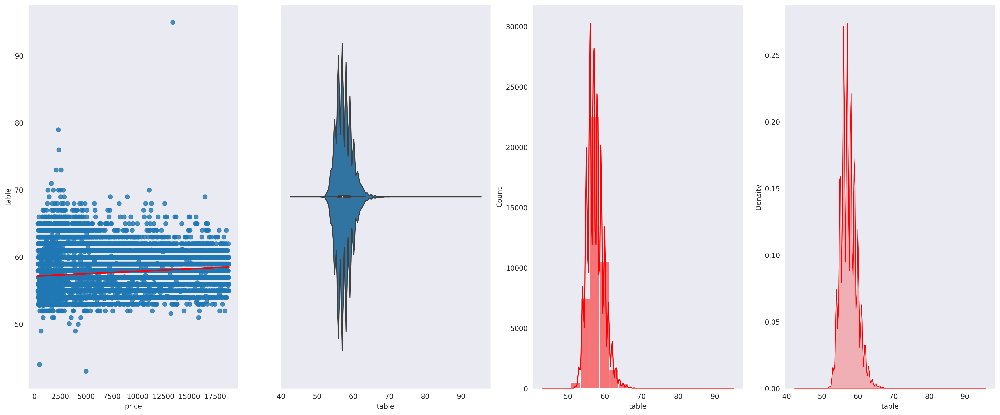

In [ ]:
# table: A diamond’s table is the flat facet on its surface — the large,
# flat surface facet that you can see when you look at the diamond from above

fig, axes = plt.subplots(1, 4, figsize=(25, 10), dpi = 290)

fig = px.box(df.table, orientation="h", template="plotly_dark", width=1240, height= 400)
fig.show()

# table vs price
sns.regplot(x= df.price, y= df.table, line_kws={"color": "red"}, ax=axes[0])

sns.set_style('dark')

sns.violinplot(x= df.table, ax=axes[1])

sns.histplot(x= df.table, bins=20, color="red", kde=True, ax=axes[2])

sns.kdeplot(x= df.table, shade=True, color='red', ax=axes[3]);


1- Most diamond tables are around 50 & 60
- the good diamond table is as how much it reflect the light

2- Look to regplot!!
- there's a diamond table > 90%
- & it also has a good impact on price!
- & this because it depend on cut & shape of diamond

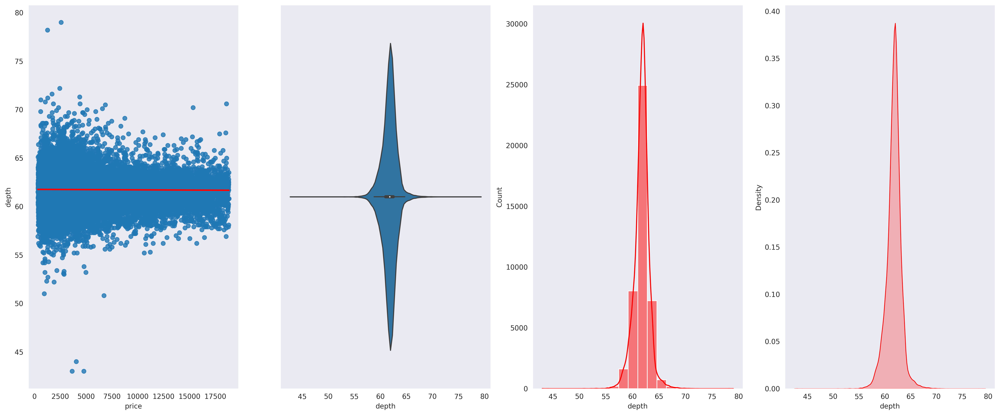

In [ ]:
# total depth

fig, axes = plt.subplots(1, 4, figsize=(25, 10), dpi = 290)

fig = px.box(df.table, orientation="h", template="plotly_dark", width=1240, height= 400)
fig.show()

# depth vs price
sns.regplot(x= df.price, y= df.depth, line_kws={"color": "red"}, ax=axes[0])

sns.set_style('dark')

sns.violinplot(x= df.depth, ax=axes[1])

sns.histplot(x= df.depth, bins=20, color="red", kde=True, ax=axes[2])

sns.kdeplot(x= df.depth, shade=True, color='red', ax=axes[3]);


- Almostly the interpretation of these plots is as the table attribute...

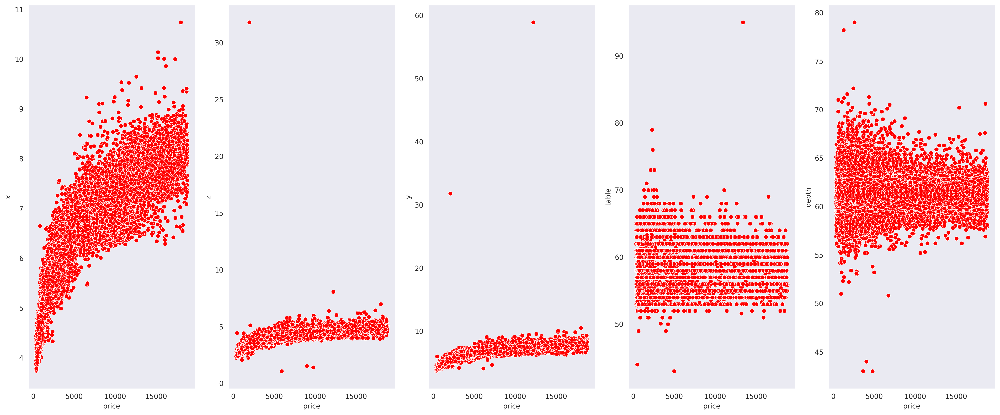

In [ ]:
# Scatterplot of price with other numerical attributes

fig, axes = plt.subplots(1, 5, figsize=(25, 10), dpi= 290)

fig = px.scatter(df, x= 'price', y= 'carat', template="plotly_dark", 
                 trendline='ols', width=1240, height= 400)
fig.show()

sns.scatterplot(x =df.price, y =df.x, color="red", ax= axes[0])

sns.set_style('dark')

sns.scatterplot(x =df.price, y =df.z, color="red", ax= axes[1])

sns.scatterplot(x =df.price, y =df.y, color="red", ax= axes[2])

sns.scatterplot(x =df.price, y =df.table, color="red", ax= axes[3])

sns.scatterplot(x =df.price, y =df.depth, color="red", ax= axes[4]);


As insights that we saw with regplot...
- same insights on maultiple plots

# B- EDA on objects attributes 🧠👓

In [ ]:
df.select_dtypes('object').columns

Index(['cut', 'color', 'clarity'], dtype='object')

# B.1 - cut attribute

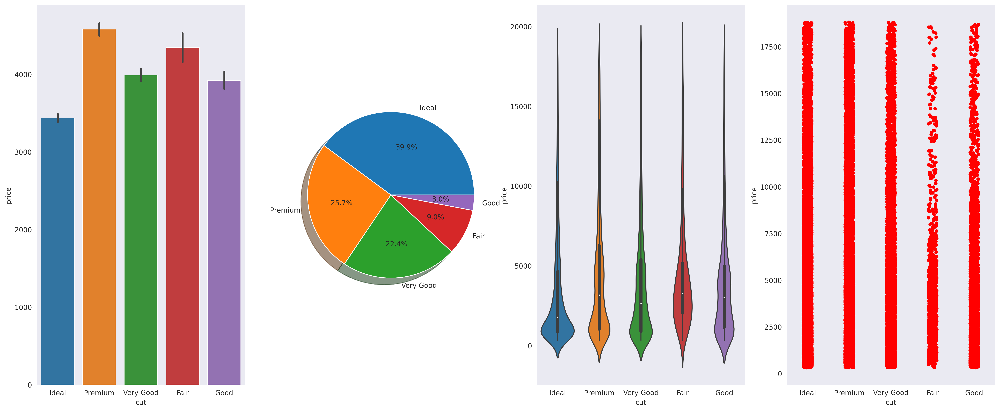

In [ ]:
fig, axes = plt.subplots(1, 4, figsize=(25, 10), dpi = 290)

fig = px.scatter(df, y="cut", x="price", color="cut", 
                 template="plotly_dark", width=1240, height= 400)
fig.show()

sns.barplot(x =df.cut, y =df.price, ax =axes[0])

sns.set_style('dark')

axes[1].pie(x =df.cut.value_counts(), labels =df.cut.unique(),
           autopct='%1.1f%%', shadow=True)

sns.violinplot(x= df.cut, y= df.price, ax =axes[2])

sns.stripplot(data= df, x='cut', y='price', color="red", ax =axes[3]);

1- Ideal cut has largest proportions ~ 40%
- while Good cut is the smaller 3%

2- Most cut proportions are:
- Ideal, premium, Very Good
- this's good point to preprocessing or feature engineering
- So, we can make the cut according the proportions to:
- Ideal, Premium, Very Good, other

3- Also look to prices of each cut:
- The ideal, Pre... have more high prices than other
- you can see this by looking to stripplot, scatterplot

4- Look to violin plot:
- Fair cut has much concentrated in low prices
- and this good point, because bad cut affect on price
- So we should minimize the proportions of fair cut

# B.2- color attribute

Color information:
- Your intention with diamond color should be to find a diamond that appears colorless:
- 1. Diamonds graded from D to F in color are regarded as colorless
- 2. Diamonds with a color grade from G to J are considered “near colorless”
- 3. Diamond color grades from K to M are regarded as having a “faint” color

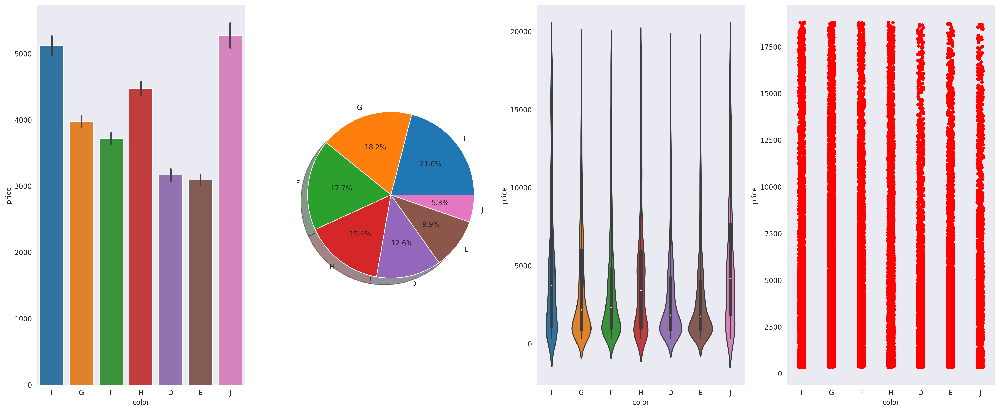

In [ ]:
# Diamond color refers to how clear a diamond is.

fig, axes = plt.subplots(1, 4, figsize=(25, 10), dpi = 290)

fig = px.scatter(df, y="color", x="price", color="color", 
                 template="plotly_dark",  width=1240, height= 400)
fig.show()

sns.barplot(x =df.color, y =df.price, ax =axes[0])

sns.set_style('dark')

axes[1].pie(x =df.color.value_counts(), labels =df.color.unique(),
           autopct='%1.1f%%', shadow=True)

sns.violinplot(x= df.color, y= df.price, ax =axes[2])

sns.stripplot(data= df, x='color', y='price', color="red", ax =axes[3]);

1- J diamond color has less proportion ~ 5%
- Also J price is more concentrated in low prices

2- I diamond color has large proportion ~ 21%
- Also the price of it, has more concentrated in high prices

3- Here i can't do division according the proportions!!
- because j(worst) has 5%, D & E (best colors) ~ at 10%
- and i can't mix the worst with the best
- i can't name the worst & best colors as "other" label
- if i do that i will do miss label to information!!!

# B.3- clarity attribute

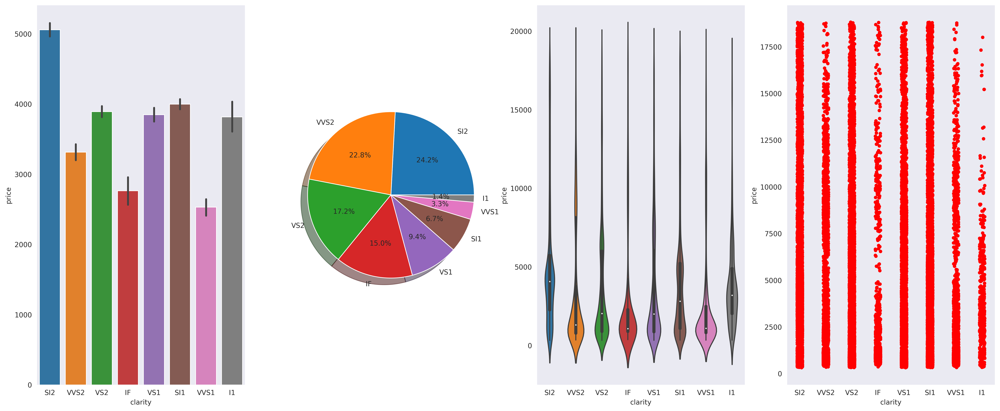

In [ ]:
fig, axes = plt.subplots(1, 4, figsize=(25, 10), dpi = 290)

fig = px.scatter(df, y="clarity", x="price", color="clarity", 
                 template="plotly_dark", width=1240, height= 400)
fig.show()

sns.barplot(x =df.clarity, y =df.price, ax =axes[0])

sns.set_style('dark')

axes[1].pie(x =df.clarity.value_counts(), labels =df.clarity.unique(), 
            autopct='%1.1f%%', shadow=True)

sns.violinplot(x= df.clarity, y= df.price, ax =axes[2])

sns.stripplot(data= df, x='clarity', y='price', color="red", ax =axes[3]);

1- l1 clarity has less proportion ~ 1.4%
- this type of clarity is the worst
- also by looking to stripplot.. we see it's more concentrated in lower prices!!
- because no one prefer to buy a diamnd with a worse clarity

2- ~ > 60% of proportions are to SI2, VVS2, VS2
- because these scales have ~ good clarity & good prices(Not too expensive)

3- FI, the best diamond clarity
- has some of high prices
- & that's logical, because the more good clarity, the more price

# 5- Feature Engineering 🌀

In [ ]:
df.cut.unique()
df.cut.value_counts()

Ideal        17159
Premium      11070
Very Good     9650
Good          3871
Fair          1288
Name: cut, dtype: int64

In [ ]:
#def map_cut(cut):
    
#    if cut == "Ideal":
#        return "Ideal"
    
#    elif cut == "Premium":
#        return "Premium"
    
#    elif cut == "Very Good":
#        return "Very Good"
    
#    else:
#        return "Other"

#df.cut = df.cut.apply(map_cut)

In [ ]:
# Cut

obj_cut = ['Ideal', 'Premium', 'Very Good', 'Good', 'Fair']
num_cut = [1, 2, 3, 4, 5]

df.cut = df.cut.replace(obj_cut, num_cut)

In [ ]:
df.cut.unique()

array([1, 2, 3, 5, 4])

In [ ]:
df.color.unique()
df.color.value_counts()

G    9035
E    7817
F    7613
H    6623
D    5411
I    4253
J    2286
Name: color, dtype: int64

In [ ]:
#def map_color(color):
    
#    if color == 'D':
#        return 'Colorless'
#    elif color == 'E':
#        return 'Colorless'
#    elif color == 'F':
#        return 'Colorless'
    
#    elif color == 'G':
#        return 'Nearcolorless'
#    elif color == 'H':
#        return 'Nearcolorless'
#    elif color == 'I':
#        return 'Nearcolorless'
    
#    else:
#        return "Worst"

#df.color = df.color.apply(map_color)    

In [ ]:
# Write colors from best grade to bad
obj_color = ['D', 'E', 'F', 'G', "H", 'I', 'J']

num_color = [1, 2, 3, 4, 5, 6, 7]

df.color = df.color.replace(obj_color, num_color)

In [ ]:
df.color.unique()

array([6, 4, 3, 5, 1, 2, 7])

In [ ]:
# Clarity 

df.clarity.unique()
df.clarity.value_counts()

SI1     10404
VS2      9803
SI2      7395
VS1      6464
VVS2     4031
VVS1     2899
IF       1440
I1        602
Name: clarity, dtype: int64

In [ ]:
#def map_clarity(clarity):
    
#    if clarity == "IF":
#        return "99% clarity"
#    elif clarity == "VVS1":
#        return "99% clarity"
#    elif clarity == "VVS2":
#        return "99% clarity"
    
#    elif clarity == "VS1":
#        return "85-95% clarity"
#    elif clarity == "VS2":
#        return "85-95% clarity"
    
#    elif clarity == "SI1":
#        return "15-50% clarity"
#    elif clarity == "SI2":
#        return "15-50% clarity"
    
#    else:
#        return "1% clarity"
    
#df.clarity = df.clarity.apply(map_clarity)

In [ ]:
# Write clarity from best 'IF' to bad 'I1'
obj_clarity = ['IF', 'VVS1', 'VVS2', 'VS1', 'VS2', 'SI1', 'SI2', 'I1']

num_clarity = [1, 2, 3, 4, 5, 6, 7, 8]

df.clarity = df.clarity.replace(obj_clarity, num_clarity)

In [ ]:
df.clarity.unique()

array([7, 3, 5, 1, 4, 6, 2, 8])

Change of object attribute values:
- Done 🎉🎉

In [ ]:
# Apply label encoder to each column with categorical data

#label_encoder = LabelEncoder()

#cat_att = df[['cut', 'color', 'clarity']]

#for col in cat_att:
  
#df[col] = label_encoder.fit_transform(df[col])

#for unique in cat_att:
#  print(unique, df[unique].unique())
#  print()

In [ ]:
#num_features = df.select_dtypes("number").reset_index(drop=True)

#obj_features = df.select_dtypes("object").reset_index(drop=True)

#ohe = OneHotEncoder(sparse_output=False)

#ohe.fit(obj_features)

#ohe_data = ohe.transform(obj_features)

#ohe_data = pd.DataFrame(ohe_data, columns=ohe.get_feature_names_out())

#full_df = pd.concat([ohe_data, num_features], axis=1)

#full_df.head()

In [ ]:
df.columns

Index(['carat', 'cut', 'color', 'clarity', 'depth', 'table', 'price', 'x', 'y',
       'z'],
      dtype='object')

In [ ]:
df.shape

(43038, 10)

In [ ]:
df.describe()

,carat,cut,color,clarity,depth,table,price,x,y,z
count,43038.000000,43038.000000,43038.000000,43038.000000,43038.000000,43038.000000,43038.000000,43038.000000,43038.000000,43038.000000
mean,0.797475,2.095195,3.593545,4.953924,61.746582,57.459375,3928.189112,5.731744,5.735116,3.539926
std,0.472928,1.114899,1.702062,1.649024,1.434702,2.233822,3982.731057,1.118784,1.146848,0.704559
min,0.200000,1.000000,1.000000,1.000000,43.000000,43.000000,326.000000,3.730000,3.680000,1.070000
25%,0.400000,1.000000,2.000000,4.000000,61.000000,56.000000,948.000000,4.710000,4.720000,2.910000
50%,0.700000,2.000000,4.000000,5.000000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.040000,3.000000,5.000000,6.000000,62.500000,59.000000,5311.750000,6.540000,6.540000,4.040000
max,5.010000,5.000000,7.000000,8.000000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


# Treat skeweness data

In [ ]:
# Treat right skeweness attribute
for skew_attr in ['x', 'y', 'z', 'carat', 'table', 'depth']:
  
  df[skew_attr] = np.log1p(df[skew_attr])

# Look to describe after handle data skeweness

df.describe()

,carat,cut,color,clarity,depth,table,price,x,y,z
count,43038.000000,43038.000000,43038.000000,43038.000000,43038.000000,43038.000000,43038.000000,43038.000000,43038.000000,43038.000000
mean,0.555158,2.095195,3.593545,4.953924,4.138841,4.067614,3928.189112,1.893237,1.893747,1.501400
std,0.244545,1.114899,1.702062,1.649024,0.022956,0.037746,3982.731057,0.164457,0.163806,0.150938
min,0.182322,1.000000,1.000000,1.000000,3.784190,3.784190,326.000000,1.553925,1.543298,0.727549
25%,0.336472,1.000000,2.000000,4.000000,4.127134,4.043051,948.000000,1.742219,1.743969,1.363537
50%,0.530628,2.000000,4.000000,5.000000,4.139955,4.060443,2401.000000,1.902108,1.903599,1.510722
75%,0.712950,3.000000,5.000000,6.000000,4.151040,4.094345,5311.750000,2.020222,2.020222,1.617406
max,1.793425,5.000000,7.000000,8.000000,4.382027,4.564348,18823.000000,2.463002,4.092677,3.490429


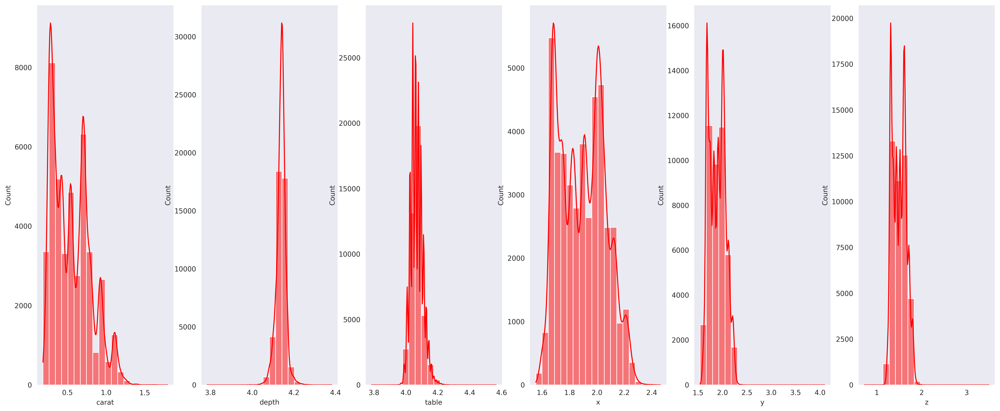

In [ ]:
# Histogram to skewness attributes after treat them

fig, axes = plt.subplots(1, 6, figsize=(25, 10), dpi = 290)

sns.histplot(x= df.carat, bins=20, color="red", kde=True, ax=axes[0])

sns.set_style('dark')

sns.histplot(x= df.depth, bins=20, color="red", kde=True, ax=axes[1])

sns.histplot(x= df.table, bins=20, color="red", kde=True, ax=axes[2])

sns.histplot(x= df.x, bins=20, color="red", kde=True, ax=axes[3])

sns.histplot(x= df.y, bins=20, color="red", kde=True, ax=axes[4])

sns.histplot(x= df.z, bins=20, color="red", kde=True, ax=axes[5]);


- Check⭕! data distribution after handle a skeweness

# 6- Data split

In [ ]:
X = df.drop('price', axis=1)

# Do logging to target
y = np.log1p(df['price'])

In [ ]:
X.columns

Index(['carat', 'cut', 'color', 'clarity', 'depth', 'table', 'x', 'y', 'z'], dtype='object')

In [ ]:
y.name

'price'

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=42)

X_train.shape

(32278, 9)

In [ ]:
y_train.shape

(32278,)

# 7- Model_building

In [ ]:
#scaler = StandardScaler() # Initialize StandardScaler object
#X = scaler.fit_transform(X) 

In [ ]:
# Instaintiate the model 
lin_reg = LinearRegression()

lin_reg.fit(X_train, y_train)

pred = lin_reg.predict(X_val)

acc = r2_score(y_val, pred)
acc
 

0.9785092700452706

In [ ]:
# Instaintiate the model 
ra_f_reg = RandomForestRegressor(n_estimators=100 , random_state=0)

ra_f_reg.fit(X_train , y_train)

pred = ra_f_reg.predict(X_val)

acc = r2_score(y_val, pred)
acc

0.9919177401609196

In [ ]:
# Instaintiate the model 
xgboost = xgboost.XGBRegressor(n_estimators= 200)

xgboost.fit(X_train, y_train)

pred = xgboost.predict(X_val)

acc = r2_score(y_val, pred)
acc

0.9925155589577656

In [ ]:
# Instaintiate the model 
cat_b = catboost.CatBoostRegressor()

cat_b.fit(X_train, y_train)

pred = cat_b.predict(X_val)

acc = r2_score(y_val, pred)
acc

Learning rate set to 0.07089
0:	learn: 0.9466475	total: 51.4ms	remaining: 51.3s
1:	learn: 0.8864091	total: 55.9ms	remaining: 27.9s
2:	learn: 0.8301585	total: 60.3ms	remaining: 20s
3:	learn: 0.7782321	total: 64.3ms	remaining: 16s
4:	learn: 0.7293809	total: 68.2ms	remaining: 13.6s
5:	learn: 0.6847831	total: 72.2ms	remaining: 12s
6:	learn: 0.6440293	total: 76.2ms	remaining: 10.8s
7:	learn: 0.6041019	total: 80.3ms	remaining: 9.95s
8:	learn: 0.5676665	total: 87.5ms	remaining: 9.64s
9:	learn: 0.5334525	total: 94.3ms	remaining: 9.34s
10:	learn: 0.5022825	total: 99.8ms	remaining: 8.97s
11:	learn: 0.4738538	total: 104ms	remaining: 8.55s
12:	learn: 0.4478121	total: 108ms	remaining: 8.18s
13:	learn: 0.4224832	total: 112ms	remaining: 7.88s
14:	learn: 0.3995169	total: 116ms	remaining: 7.61s
15:	learn: 0.3781011	total: 120ms	remaining: 7.37s
16:	learn: 0.3584610	total: 124ms	remaining: 7.16s
17:	learn: 0.3396306	total: 128ms	remaining: 6.97s
18:	learn: 0.3225333	total: 132ms	remaining: 6.8s
19:	lear

0.9927319681562319

In [ ]:
# Lightgbm
lgm_r = lightgbm.LGBMRegressor()

lgm_r.fit(X_train, y_train)

pred_lgm = lgm_r.predict(X_val)

acc = r2_score(y_val, pred_lgm)
acc


0.9921236409698128

In [ ]:
# include 3 algorithm together by Voiting

vr1 = RandomForestRegressor(random_state=42)
vr2 = xgboost.XGBRegressor()
vr3 = catboost.CatBoostRegressor()

# Voiting algorithm
vr = VotingRegressor([('vr1', vr1), ('vr2', vr2), ('vr3', vr3)])

vr = vr.fit(X_train, y_train);

Learning rate set to 0.07089
0:	learn: 0.9466475	total: 4.7ms	remaining: 4.7s
1:	learn: 0.8864091	total: 8.8ms	remaining: 4.39s
2:	learn: 0.8301585	total: 13.9ms	remaining: 4.63s
3:	learn: 0.7782321	total: 17.9ms	remaining: 4.46s
4:	learn: 0.7293809	total: 21.9ms	remaining: 4.35s
5:	learn: 0.6847831	total: 25.8ms	remaining: 4.27s
6:	learn: 0.6440293	total: 29.7ms	remaining: 4.21s
7:	learn: 0.6041019	total: 34ms	remaining: 4.22s
8:	learn: 0.5676665	total: 37.9ms	remaining: 4.17s
9:	learn: 0.5334525	total: 41.8ms	remaining: 4.14s
10:	learn: 0.5022825	total: 45.7ms	remaining: 4.11s
11:	learn: 0.4738538	total: 49.7ms	remaining: 4.09s
12:	learn: 0.4478121	total: 53.6ms	remaining: 4.07s
13:	learn: 0.4224832	total: 57.5ms	remaining: 4.05s
14:	learn: 0.3995169	total: 61.3ms	remaining: 4.03s
15:	learn: 0.3781011	total: 65.2ms	remaining: 4.01s
16:	learn: 0.3584610	total: 69.1ms	remaining: 3.99s
17:	learn: 0.3396306	total: 72.9ms	remaining: 3.97s
18:	learn: 0.3225333	total: 76.7ms	remaining: 3.96

In [ ]:
pred_vr = vr.predict(X_val)

# Accuray
print("Accuracy: ", r2_score(y_val, pred_vr))
print()

# MAE
print("MAE:", mean_absolute_error(y_val, pred_vr))
print()

# RMSE
print("RMSE:", mean_squared_error(y_val, pred_vr, squared=False))

Accuracy:  0.9930146846032097

MAE: 0.060767369062686025

RMSE: 0.08498564206672542


What?? MAE & RMSE are around zeros?
- yeah, because we managed the skeweness by log1p
- also we applied log1p on target "price"
- So, that's normal

# 8- let's draw to identify the performance of the model

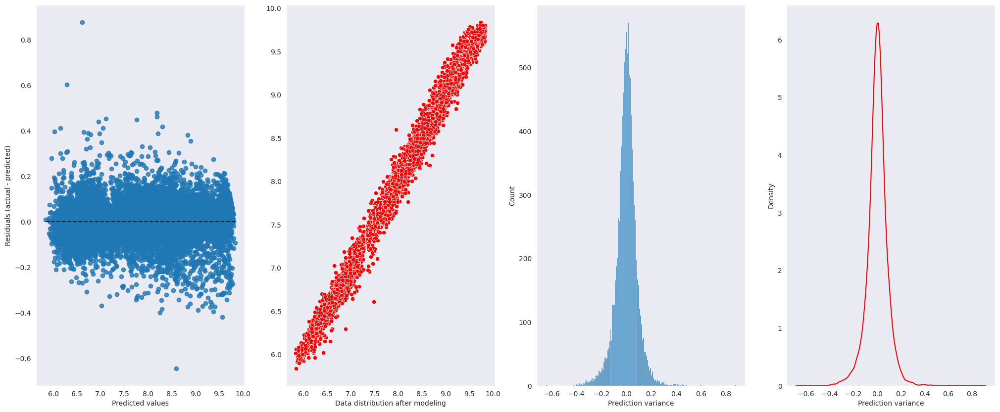

In [ ]:
fig, axes = plt.subplots(1, 4, figsize=(25, 10))

# Plot 1
from sklearn.metrics import PredictionErrorDisplay
display = PredictionErrorDisplay(y_true=y_val, y_pred=pred_vr)
display.plot(ax=axes[0])

# Plot 2
sns.scatterplot(x=y_val, y=pred_vr, ax=axes[1], color='r')
axes[1].set(xlabel='Data distribution after modeling')

# Plot 3
sns.histplot(y_val - pred_vr, ax=axes[2])
axes[2].set(xlabel="Prediction variance")

# Plot 4
sns.kdeplot(y_val - pred_vr, ax=axes[3], color='r')
axes[3].set(xlabel="Prediction variance");

Looks Good!!
- Uptrend on scatterplot
- Normal distribution on hist, kde
- All these mean that the model will doing great with new data

# 9- Include all above steps in a class


```
- But without treat to skeweness data

```


In [ ]:
# instiantiate the class 
class wrangle_train_evaluate:
  
  # Initialize self
  def __init__(self):
    self.self = ()

  # data wrangling
  def wrangle_data(self, data, index_col=None):
    df = pd.read_csv(data)
      
    # drop duplicated values
    df.drop_duplicates(inplace=True)
      
    # drop rows that have zeros
    df = df.drop(df[df.x == 0].index)
    df = df.drop(df[df.y == 0].index)
    df = df.drop(df[df.z == 0].index)
      
    # Encode object variables with number   
    obj_cut = ['Ideal', 'Premium', 'Very Good', 'Good', 'Fair']
    num_cut = [1, 2, 3, 4, 5]
    df.cut = df.cut.replace(obj_cut, num_cut)
      
    obj_color = ['D', 'E', 'F', 'G', "H", 'I', 'J']
    num_color = [1, 2, 3, 4, 5, 6, 7]
    df.color = df.color.replace(obj_color, num_color)
        
    obj_clarity = ['IF', 'VVS1', 'VVS2', 'VS1', 'VS2', 'SI1', 'SI2', 'I1']
    num_clarity = [1, 2, 3, 4, 5, 6, 7, 8]
    df.clarity = df.clarity.replace(obj_clarity, num_clarity)
        
    # Treat right skeweness attribute by np.log1p
    #for skew_attr in ['x', 'y', 'z', 'carat', 'table', 'depth']:
    #  df[skew_attr] = np.log1p(df[skew_attr])

    return df

  # data split      
  def data_split(self, wrangle):
    
    X = df.drop('price', axis=1)
    #y = np.log1p(df['price'])
    y = df['price']

    return X, y
        
  def train(self, X_train, y_train):
    
    #Instaintiate algorithms
    vr1 = RandomForestRegressor(random_state=42)
    vr2 = xgboost.XGBRegressor()
    vr3 = catboost.CatBoostRegressor()
        
    vr = VotingRegressor([('vr1', vr1), ('vr2', vr2), ('vr3', vr3)])
    vr = vr.fit(X_train, y_train)
        
    return vr
        
  def evaluate(self, model, X_val, y_val):
    pred_vr = model.predict(X_val)
        
    # Calculate metrices
    accuracy = r2_score(y_val, pred_vr)
    mae = mean_absolute_error(y_val, pred_vr)
    rmse = mean_squared_error(y_val, pred_vr, squared=False)

    df_metrics = pd.DataFrame({"Model_Name": ['VotingRegressor'], 'Accuracy': [accuracy], 'MAE': [mae], 'RMSE': [rmse]})
    return df_metrics

# instintiate class
Model = wrangle_train_evaluate()

# Wrangle the data
wrangle = Model.wrangle_data(data= "Diamond-train.csv", index_col="Id")

X, y = Model.data_split(wrangle)

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=42)

# Train the model
model = Model.train(X_train, y_train)
print('----------------------------------')

# Evaluate the model
df_metrics= Model.evaluate(model, X_val, y_val)

# Display dataframe metrics
print(df_metrics)

Learning rate set to 0.07089
0:	learn: 3739.0367483	total: 4.76ms	remaining: 4.76s
1:	learn: 3509.2056716	total: 9.53ms	remaining: 4.75s
2:	learn: 3297.1292773	total: 17.2ms	remaining: 5.73s
3:	learn: 3102.3597765	total: 24.2ms	remaining: 6.02s
4:	learn: 2913.6077265	total: 30.9ms	remaining: 6.15s
5:	learn: 2746.1839435	total: 34.6ms	remaining: 5.74s
6:	learn: 2586.4346333	total: 39.8ms	remaining: 5.64s
7:	learn: 2441.6958139	total: 46.2ms	remaining: 5.73s
8:	learn: 2308.4965242	total: 50.1ms	remaining: 5.51s
9:	learn: 2181.1134787	total: 53.9ms	remaining: 5.34s
10:	learn: 2061.2233676	total: 58.6ms	remaining: 5.27s
11:	learn: 1951.2227239	total: 62.7ms	remaining: 5.16s
12:	learn: 1848.0646940	total: 66.4ms	remaining: 5.04s
13:	learn: 1752.6049028	total: 70.2ms	remaining: 4.94s
14:	learn: 1666.9962897	total: 73.9ms	remaining: 4.85s
15:	learn: 1586.6002276	total: 77.7ms	remaining: 4.78s
16:	learn: 1511.8948113	total: 81.6ms	remaining: 4.72s
17:	learn: 1442.9956166	total: 85.6ms	remainin

In [ ]:
# Evaluate the model
Model.evaluate(model, X_val, y_val)

,Model_Name,Accuracy,MAE,RMSE
0,VotingRegressor,0.982822,259.78169,520.771552


Note!! there's differance in accuracy!
- beacuse we remove the treatment of skeweness

# 10- Saveing the model

In [ ]:
import pickle

pickle.dump(vr, open("VotReg_model.pkl", "wb"))

---

# 11 - Test

In [ ]:
#test = pd.read_csv("1.2- Diamond_test.csv")

In [ ]:
# Read test data by class
test = Model.wrangle_data(data= "Diamond-test.csv")

test.head()

,Id,carat,cut,color,clarity,depth,table,x,y,z
0,1,0.34,1,4,3,61.1,57.0,4.52,4.48,2.75
1,2,0.71,2,2,5,62.7,58.0,5.74,5.68,3.58
2,3,0.44,3,6,4,62.8,56.0,4.83,4.88,3.05
3,4,0.81,2,2,7,60.1,59.0,6.09,6.03,3.65
4,5,0.40,1,4,2,61.2,56.0,4.74,4.80,2.92


In [ ]:
Id=test['Id']

In [ ]:
pred_vr = vr.predict(test.drop('Id', axis=1))

data={'Id': Id, 'price': pred_vr}

sub = pd.DataFrame(data=data)

sub.describe()

,Id,price
count,10785.000000,10785.000000
mean,5394.847844,9.292608
std,3114.534979,0.526527
min,1.000000,8.395009
25%,2698.000000,8.754608
50%,5395.000000,9.445992
75%,8092.000000,9.807890
max,10788.000000,10.063418


In [ ]:
sub.to_csv('Diamond_Prediction.csv', index=False)